In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/organizations/nih-chest-xrays/data/LOG_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/README_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/BBox_List_2017.csv
/kaggle/input/datasets/organizations/nih-chest-xrays/data/test_list.txt
/kaggle/input/datasets/organizations/nih-chest-xrays/data/ARXIV_V5_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/Data_Entry_2017.csv
/kaggle/input/datasets/organizations/nih-chest-xrays/data/train_val_list.txt
/kaggle/input/datasets/organizations/nih-chest-xrays/data/FAQ_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006199_010.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004833_016.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006260_000.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004911_010.png
/kaggle/inpu

In [2]:
import os
import glob
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from sklearn.model_selection import train_test_split

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [3]:
DATA_ROOT = "/kaggle/input/nih-chest-xrays"

In [4]:
for root, dirs, files in os.walk(DATA_ROOT):
    for f in files:
        if f.endswith(".csv"):
            print(os.path.join(root, f))

In [5]:
df = pd.read_csv(f"/kaggle/input/datasets/organizations/nih-chest-xrays/data/Data_Entry_2017.csv")

df.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


In [6]:
print(df.shape)

(112120, 12)


In [7]:
df["Target"] = df["Finding Labels"].apply(
    lambda labels: 1 if "Pneumonia" in str(labels).split("|") else 0
)

print(df["Target"].value_counts())

Target
0    110689
1      1431
Name: count, dtype: int64


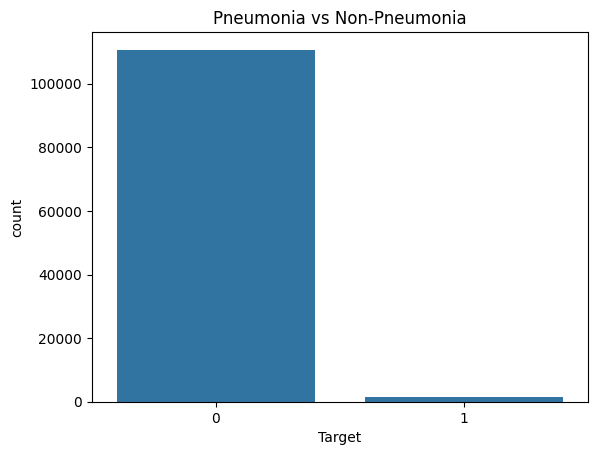

In [8]:
sns.countplot(x="Target", data=df)
plt.title("Pneumonia vs Non-Pneumonia")
plt.show()

In [9]:
pneumonia_df = df[df["Target"] == 1]

non_pneumonia_df = df[df["Target"] == 0].sample(
    n=len(pneumonia_df) * 2,
    random_state=42
)

df_balanced = pd.concat([pneumonia_df, non_pneumonia_df])
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

print(df_balanced["Target"].value_counts())

Target
0    2862
1    1431
Name: count, dtype: int64


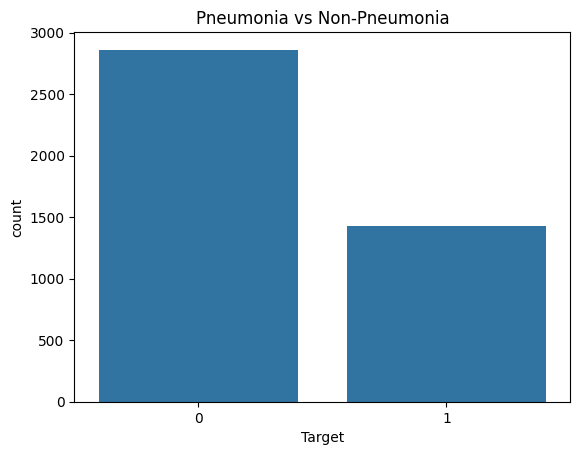

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(x="Target", data=df_balanced)
plt.title("Pneumonia vs Non-Pneumonia")
plt.show()

In [11]:
DATA_ROOT = "/kaggle/input/datasets/organizations/nih-chest-xrays/data"

In [12]:
import os

all_images = []

for root, dirs, files in os.walk(DATA_ROOT):
    for file in files:
        if file.endswith(".png"):
            all_images.append(os.path.join(root, file))

print("Total images found:", len(all_images))
print(all_images[:5])

Total images found: 112120
['/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006199_010.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004833_016.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006260_000.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004911_010.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004186_007.png']


In [13]:
image_path_map = {os.path.basename(x): x for x in all_images}

df_balanced["path"] = df_balanced["Image Index"].map(image_path_map)
df_balanced = df_balanced.dropna(subset=["path"]).reset_index(drop=True)

print(df_balanced.shape)
print(df_balanced["path"].isnull().sum())
df_balanced[["Image Index", "path"]].head()

(4293, 14)
0


,Image Index,path
0,00018472_001.png,/kaggle/input/datasets/organizations/nih-chest...
1,00000116_020.png,/kaggle/input/datasets/organizations/nih-chest...
2,00002003_002.png,/kaggle/input/datasets/organizations/nih-chest...
3,00016490_019.png,/kaggle/input/datasets/organizations/nih-chest...
4,00026050_010.png,/kaggle/input/datasets/organizations/nih-chest...


In [14]:
from sklearn.model_selection import train_test_split

train_df, temp_df = train_test_split(
    df_balanced,
    test_size=0.3,
    stratify=df_balanced["Target"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df["Target"],
    random_state=42
)

print("Train shape:", train_df.shape)
print("Validation shape:", val_df.shape)
print("Test shape:", test_df.shape)

Train shape: (3005, 14)
Validation shape: (644, 14)
Test shape: (644, 14)


In [15]:
print("Train target distribution:")
print(train_df["Target"].value_counts())

print("\nValidation target distribution:")
print(val_df["Target"].value_counts())

print("\nTest target distribution:")
print(test_df["Target"].value_counts())

Train target distribution:
Target
0    2003
1    1002
Name: count, dtype: int64

Validation target distribution:
Target
0    429
1    215
Name: count, dtype: int64

Test target distribution:
Target
0    430
1    214
Name: count, dtype: int64


In [16]:
from torchvision import transforms

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

In [17]:
def clahe_enhancement(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(gray)
    img = cv2.cvtColor(cl, cv2.COLOR_GRAY2RGB)
    return img

In [18]:
class ChestXrayDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.loc[idx, "path"]
        label = self.dataframe.loc[idx, "Target"]

        image = Image.open(img_path).convert("RGB")
        image = np.array(image)

        image = clahe_enhancement(image)
        image = Image.fromarray(image)

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.float32)

In [19]:
train_dataset = ChestXrayDataset(train_df, transform=train_transform)
val_dataset = ChestXrayDataset(val_df, transform=val_test_transform)
test_dataset = ChestXrayDataset(test_df, transform=val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

print("Train dataset size:", len(train_dataset))
print("Validation dataset size:", len(val_dataset))
print("Test dataset size:", len(test_dataset))
print("Train batches:", len(train_loader))
print("Validation batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train dataset size: 3005
Validation dataset size: 644
Test dataset size: 644
Train batches: 94
Validation batches: 21
Test batches: 21


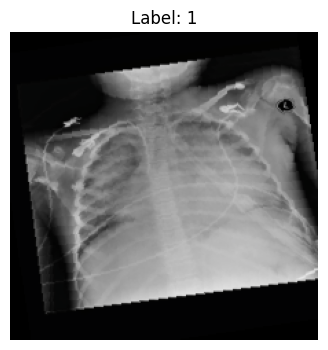

In [20]:
images, labels = next(iter(train_loader))

img = images[0].permute(1, 2, 0).numpy()
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img = np.clip(img, 0, 1)

plt.figure(figsize=(4,4))
plt.imshow(img)
plt.title(f"Label: {int(labels[0].item())}")
plt.axis("off")
plt.show()

In [21]:
import os

os.makedirs("/kaggle/working/processed_data", exist_ok=True)

train_df.to_csv("/kaggle/working/processed_data/train.csv", index=False)
val_df.to_csv("/kaggle/working/processed_data/val.csv", index=False)
test_df.to_csv("/kaggle/working/processed_data/test.csv", index=False)

print("Saved successfully to /kaggle/working/processed_data")

Saved successfully to /kaggle/working/processed_data


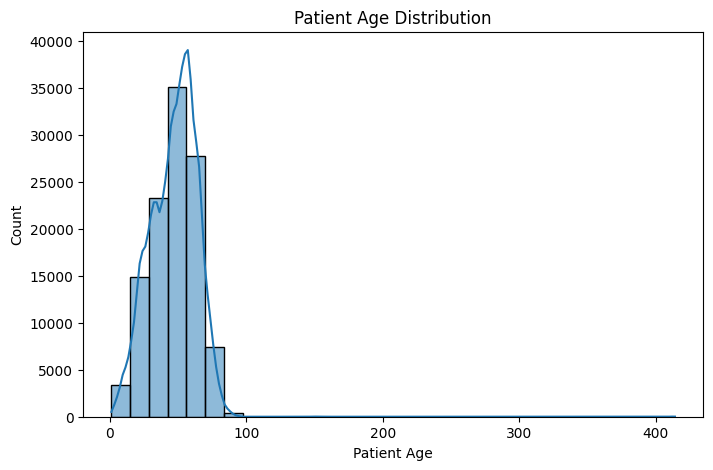

count    112120.000000
mean         46.901463
std          16.839923
min           1.000000
25%          35.000000
50%          49.000000
75%          59.000000
max         414.000000
Name: Patient Age, dtype: float64


In [22]:
plt.figure(figsize=(8,5))
sns.histplot(df["Patient Age"], bins=30, kde=True)
plt.title("Patient Age Distribution")
plt.show()

print(df["Patient Age"].describe())

Patient Gender
M    63340
F    48780
Name: count, dtype: int64


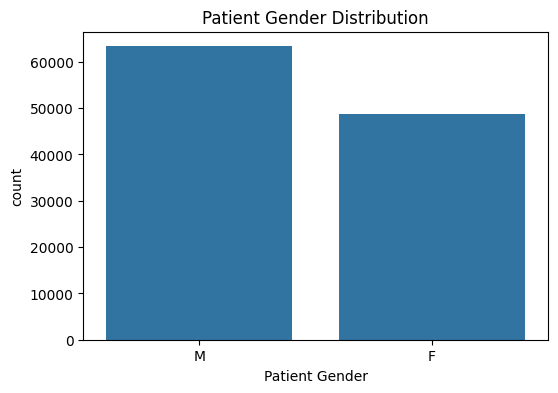

In [23]:
print(df["Patient Gender"].value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x="Patient Gender", data=df)
plt.title("Patient Gender Distribution")
plt.show()

View Position
PA    67310
AP    44810
Name: count, dtype: int64


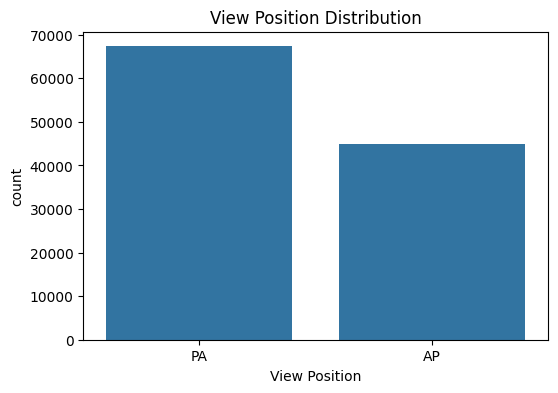

In [24]:
print(df["View Position"].value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x="View Position", data=df)
plt.title("View Position Distribution")
plt.show()

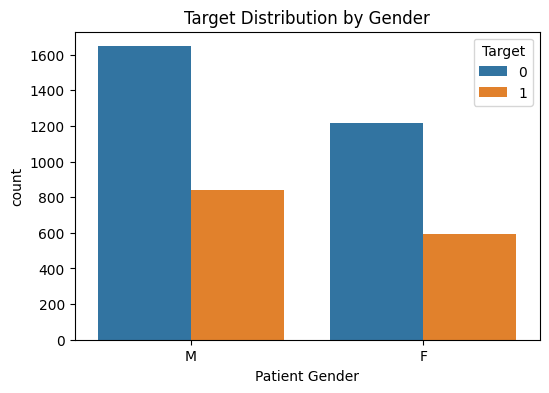

In [25]:
plt.figure(figsize=(6,4))
sns.countplot(x="Patient Gender", hue="Target", data=df_balanced)
plt.title("Target Distribution by Gender")
plt.show()

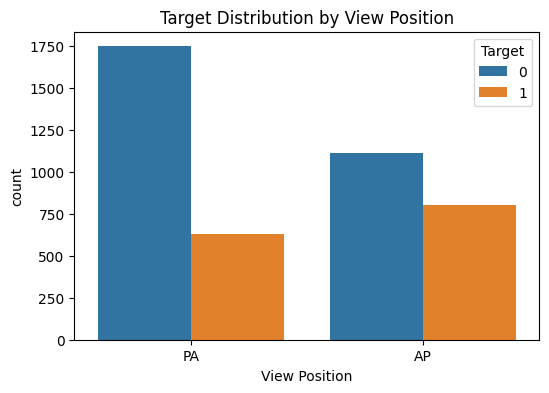

In [26]:
plt.figure(figsize=(6,4))
sns.countplot(x="View Position", hue="Target", data=df_balanced)
plt.title("Target Distribution by View Position")
plt.show()

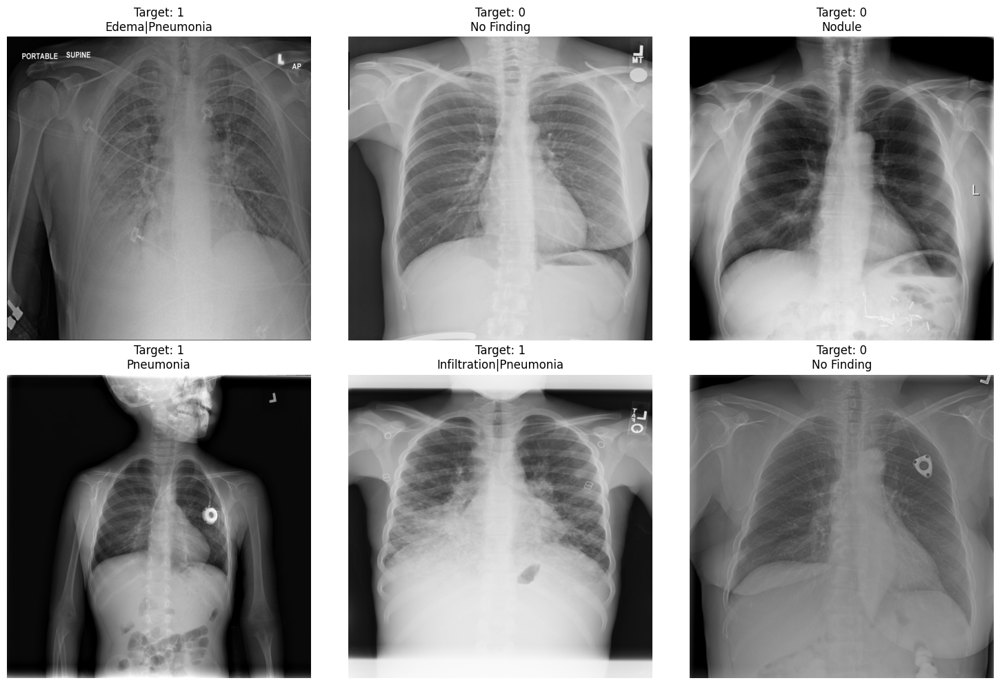

In [27]:
sample_rows = df_balanced.sample(6, random_state=42)

plt.figure(figsize=(15,10))
for i, (_, row) in enumerate(sample_rows.iterrows()):
    img = Image.open(row["path"]).convert("RGB")
    plt.subplot(2,3,i+1)
    plt.imshow(img, cmap="gray")
    plt.title(f'Target: {row["Target"]}\n{row["Finding Labels"]}')
    plt.axis("off")

plt.tight_layout()
plt.show()

In [28]:
print("EDA and preprocessing completed successfully.")
print("Final balanced dataset size:", df_balanced.shape)
print("Train set:", train_df.shape)
print("Validation set:", val_df.shape)
print("Test set:", test_df.shape)

EDA and preprocessing completed successfully.
Final balanced dataset size: (4293, 14)
Train set: (3005, 14)
Validation set: (644, 14)
Test set: (644, 14)


In [29]:
import os, random, copy, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

from sklearn.metrics import (
    roc_auc_score, classification_report,
    confusion_matrix, ConfusionMatrixDisplay
)

# ── reproducibility ──
SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', DEVICE)

Device: cuda


In [30]:
def build_alexnet(freeze_features=True):
    """AlexNet — Wang et al. used this as a baseline."""
    model = models.alexnet(weights=models.AlexNet_Weights.IMAGENET1K_V1)
    if freeze_features:
        for p in model.features.parameters():
            p.requires_grad = False
    # replace the 1000-class head → binary
    model.classifier[6] = nn.Linear(4096, 1)
    return model


def build_vgg16(freeze_features=True):
    """VGG-16 — used in the paper."""
    model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
    if freeze_features:
        for p in model.features.parameters():
            p.requires_grad = False
    model.classifier[6] = nn.Linear(4096, 1)
    return model



def build_resnet50(freeze_features=True):
    """ResNet-50 — best performer in Wang et al."""
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
    if freeze_features:
        for name, p in model.named_parameters():
            if 'layer4' not in name and 'fc' not in name:
                p.requires_grad = False
    model.fc = nn.Linear(model.fc.in_features, 1)
    return model


# quick sanity-check
for name, fn in [('AlexNet', build_alexnet), ('VGG-16', build_vgg16),
                 ('GoogLeNet', build_googlenet), ('ResNet-50', build_resnet50)]:
    m = fn()
    trainable = sum(p.numel() for p in m.parameters() if p.requires_grad)
    total     = sum(p.numel() for p in m.parameters())
    print(f'{name:12s}  trainable={trainable:,}  total={total:,}')

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 184MB/s] 


AlexNet       trainable=54,538,241  total=57,007,937
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:02<00:00, 186MB/s] 


VGG-16        trainable=119,549,953  total=134,264,641
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth


100%|██████████| 49.7M/49.7M [00:00<00:00, 201MB/s]
/usr/local/lib/python3.12/dist-packages/torchvision/models/googlenet.py:341: UserWarning: auxiliary heads in the pretrained googlenet model are NOT pretrained, so make sure to train them
  warnings.warn(


GoogLeNet     trainable=4,333,059  total=9,932,963
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 199MB/s]


ResNet-50     trainable=14,966,785  total=23,510,081


In [31]:
def train_model(model, train_loader, val_loader,
                num_epochs=10, lr=1e-4, is_googlenet=False):
    model = model.to(DEVICE)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()), lr=lr
    )
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

    history = {'train_loss': [], 'val_loss': [], 'val_auc': []}
    best_auc, best_wts = 0.0, copy.deepcopy(model.state_dict())

    for epoch in range(num_epochs):
        # ── TRAIN ──
        model.train()
        running_loss = 0.0
        for imgs, labels in train_loader:
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE).unsqueeze(1)
            optimizer.zero_grad()
            if is_googlenet:
                out = model(imgs)          # GoogLeNetOutputs namedtuple
                loss = (criterion(out.logits, labels)
                        + 0.3 * criterion(out.aux_logits2, labels)
                        + 0.3 * criterion(out.aux_logits1, labels))
            else:
                loss = criterion(model(imgs), labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * imgs.size(0)
        train_loss = running_loss / len(train_loader.dataset)

        # ── VALIDATE ──
        model.eval()
        val_loss, all_probs, all_labels = 0.0, [], []
        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs, labels = imgs.to(DEVICE), labels.to(DEVICE).unsqueeze(1)
                logits = model(imgs)
                if is_googlenet: logits = logits.logits
                val_loss += criterion(logits, labels).item() * imgs.size(0)
                all_probs.extend(torch.sigmoid(logits).cpu().numpy().flatten())
                all_labels.extend(labels.cpu().numpy().flatten())
        val_loss /= len(val_loader.dataset)
        val_auc   = roc_auc_score(all_labels, all_probs)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_auc'].append(val_auc)

        if val_auc > best_auc:
            best_auc = val_auc
            best_wts = copy.deepcopy(model.state_dict())

        scheduler.step()
        print(f'  Epoch [{epoch+1:02d}/{num_epochs}]  '
              f'train_loss={train_loss:.4f}  val_loss={val_loss:.4f}  val_AUC={val_auc:.4f}')

    model.load_state_dict(best_wts)
    print(f'  Best val AUC: {best_auc:.4f}')
    return model, history


def plot_history(history, title=''):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes[0].plot(history['train_loss'], label='train')
    axes[0].plot(history['val_loss'],   label='val')
    axes[0].set_title(f'{title} — Loss'); axes[0].legend()
    axes[1].plot(history['val_auc'], color='green', label='val AUC')
    axes[1].set_title(f'{title} — Val AUC'); axes[1].legend()
    plt.tight_layout(); plt.show()

=== AlexNet ===
  Epoch [01/10]  train_loss=0.6359  val_loss=0.5933  val_AUC=0.6748
  Epoch [02/10]  train_loss=0.5961  val_loss=0.5945  val_AUC=0.6752
  Epoch [03/10]  train_loss=0.5903  val_loss=0.5906  val_AUC=0.6849
  Epoch [04/10]  train_loss=0.5778  val_loss=0.6124  val_AUC=0.6625
  Epoch [05/10]  train_loss=0.5764  val_loss=0.5944  val_AUC=0.6813
  Epoch [06/10]  train_loss=0.5546  val_loss=0.6010  val_AUC=0.6800
  Epoch [07/10]  train_loss=0.5517  val_loss=0.5932  val_AUC=0.6844
  Epoch [08/10]  train_loss=0.5493  val_loss=0.5967  val_AUC=0.6792
  Epoch [09/10]  train_loss=0.5360  val_loss=0.5996  val_AUC=0.6879
  Epoch [10/10]  train_loss=0.5356  val_loss=0.5937  val_AUC=0.6818
  Best val AUC: 0.6879


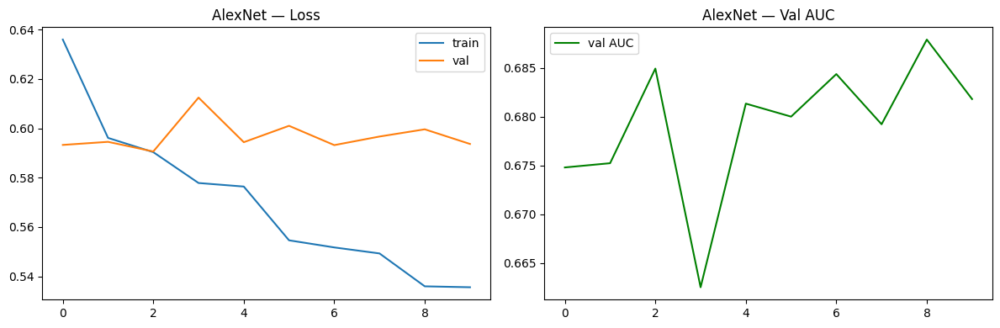

In [32]:
print('=== AlexNet ===')
alexnet_model, alexnet_hist = train_model(
    build_alexnet(), train_loader, val_loader, num_epochs=10
)
plot_history(alexnet_hist, 'AlexNet')
torch.save(alexnet_model.state_dict(), 'alexnet_chestxray.pth')

=== VGG-16 ===
  Epoch [01/10]  train_loss=0.6281  val_loss=0.6111  val_AUC=0.6491
  Epoch [02/10]  train_loss=0.6012  val_loss=0.6038  val_AUC=0.6785
  Epoch [03/10]  train_loss=0.6013  val_loss=0.6732  val_AUC=0.6736
  Epoch [04/10]  train_loss=0.5884  val_loss=0.6108  val_AUC=0.6720
  Epoch [05/10]  train_loss=0.5671  val_loss=0.6206  val_AUC=0.6710
  Epoch [06/10]  train_loss=0.5490  val_loss=0.6237  val_AUC=0.6655
  Epoch [07/10]  train_loss=0.5514  val_loss=0.6041  val_AUC=0.6741
  Epoch [08/10]  train_loss=0.5259  val_loss=0.6338  val_AUC=0.6677
  Epoch [09/10]  train_loss=0.5132  val_loss=0.6282  val_AUC=0.6631
  Epoch [10/10]  train_loss=0.4981  val_loss=0.6264  val_AUC=0.6637
  Best val AUC: 0.6785


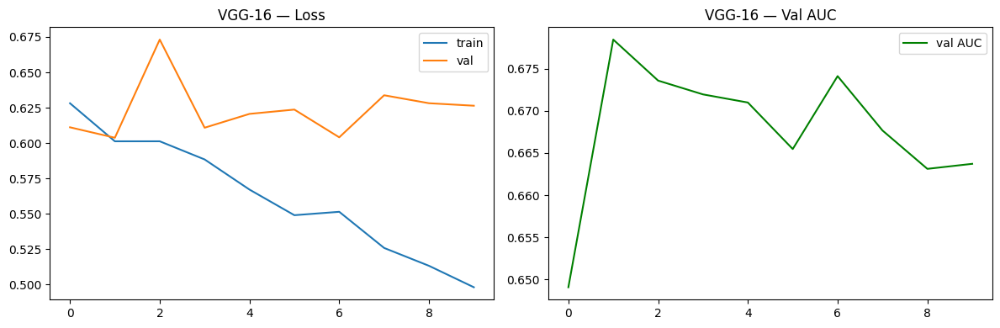

In [35]:
print('=== VGG-16 ===')
vgg_model, vgg_hist = train_model(
    build_vgg16(), train_loader, val_loader, num_epochs=10
)
plot_history(vgg_hist, 'VGG-16')
torch.save(vgg_model.state_dict(), 'vgg16_chestxray.pth')

=== ResNet-50 ===
  Epoch [01/10]  train_loss=0.6069  val_loss=0.6219  val_AUC=0.6838
  Epoch [02/10]  train_loss=0.5697  val_loss=0.6304  val_AUC=0.7054
  Epoch [03/10]  train_loss=0.5351  val_loss=0.6418  val_AUC=0.6745
  Epoch [04/10]  train_loss=0.4939  val_loss=0.6732  val_AUC=0.6891
  Epoch [05/10]  train_loss=0.4549  val_loss=0.7517  val_AUC=0.6811
  Epoch [06/10]  train_loss=0.3711  val_loss=0.8179  val_AUC=0.6912
  Epoch [07/10]  train_loss=0.3047  val_loss=0.9633  val_AUC=0.6865
  Epoch [08/10]  train_loss=0.2811  val_loss=0.8958  val_AUC=0.6606
  Epoch [09/10]  train_loss=0.2440  val_loss=0.9939  val_AUC=0.6656
  Epoch [10/10]  train_loss=0.2166  val_loss=1.1819  val_AUC=0.6623
  Best val AUC: 0.7054


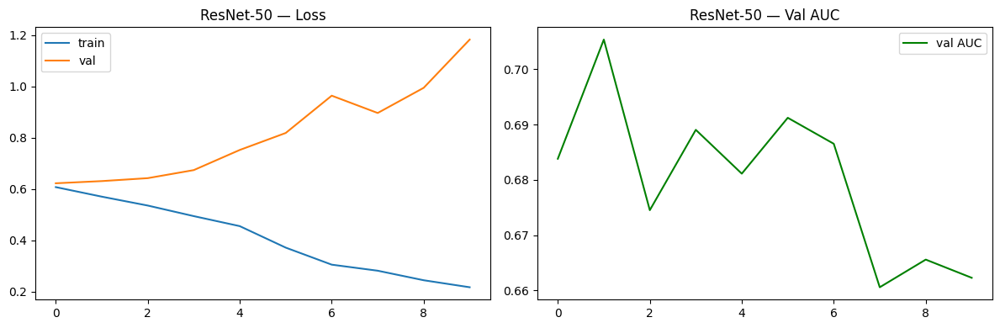

In [34]:
print('=== ResNet-50 ===')
resnet_model, resnet_hist = train_model(
    build_resnet50(), train_loader, val_loader, num_epochs=10
)
plot_history(resnet_hist, 'ResNet-50')
torch.save(resnet_model.state_dict(), 'resnet50_chestxray.pth')


──── AlexNet ─────────────────────────
AUC: 0.7057
               precision    recall  f1-score   support

Non-Pneumonia       0.75      0.80      0.78       430
    Pneumonia       0.54      0.47      0.50       214

     accuracy                           0.69       644
    macro avg       0.65      0.63      0.64       644
 weighted avg       0.68      0.69      0.68       644



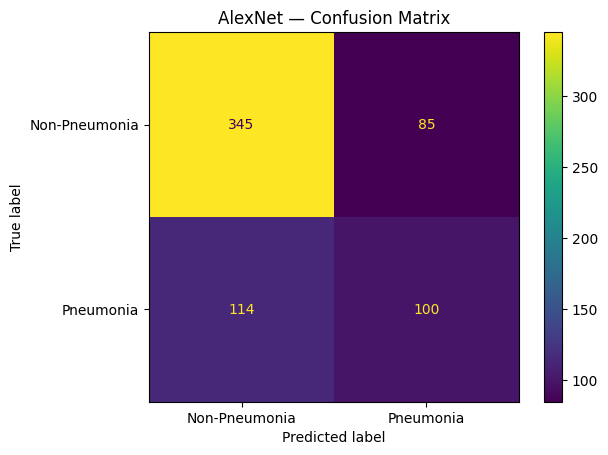


──── VGG-16 ─────────────────────────
AUC: 0.6872
               precision    recall  f1-score   support

Non-Pneumonia       0.73      0.85      0.78       430
    Pneumonia       0.54      0.36      0.43       214

     accuracy                           0.68       644
    macro avg       0.63      0.60      0.61       644
 weighted avg       0.66      0.68      0.66       644



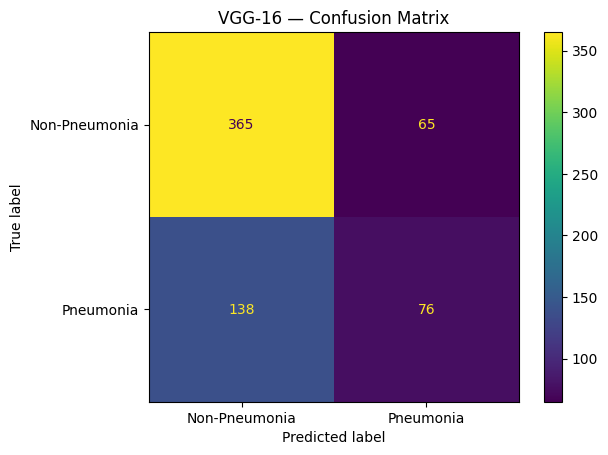


──── ResNet-50 ─────────────────────────
AUC: 0.6946
               precision    recall  f1-score   support

Non-Pneumonia       0.72      0.87      0.79       430
    Pneumonia       0.56      0.33      0.41       214

     accuracy                           0.69       644
    macro avg       0.64      0.60      0.60       644
 weighted avg       0.67      0.69      0.67       644



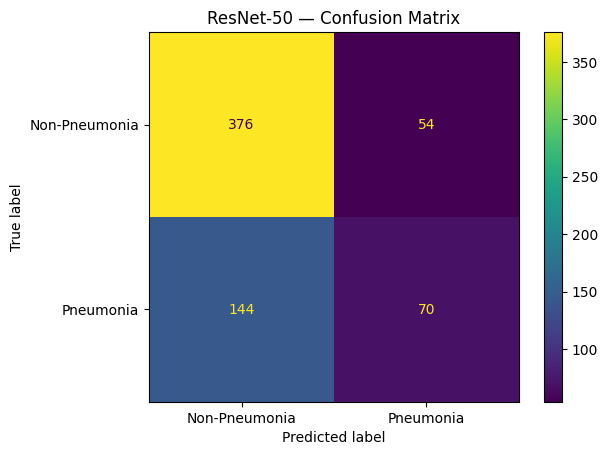


=== AUC Summary ===
  AlexNet     : 0.7057
  ResNet-50   : 0.6946
  VGG-16      : 0.6872


In [38]:
def evaluate_model(model, loader, name=''):

    model.eval().to(DEVICE)

    all_probs, all_labels, all_preds = [], [], []

    with torch.no_grad():

        for imgs, labels in loader:

            imgs = imgs.to(DEVICE)

            logits = model(imgs)

            probs = torch.sigmoid(logits).cpu().numpy().flatten()

            preds = (probs >= 0.5).astype(int)

            all_probs.extend(probs)
            all_labels.extend(labels.numpy())
            all_preds.extend(preds)

    auc = roc_auc_score(all_labels, all_probs)

    print(f'\n──── {name} ─────────────────────────')

    print(f'AUC: {auc:.4f}')

    print(classification_report(
        all_labels,
        all_preds,
        target_names=['Non-Pneumonia','Pneumonia']
    ))

    cm = confusion_matrix(all_labels, all_preds)

    ConfusionMatrixDisplay(
        cm,
        display_labels=['Non-Pneumonia','Pneumonia']
    ).plot()

    plt.title(f'{name} — Confusion Matrix')

    plt.show()

    return auc


results = {}

results['AlexNet'] = evaluate_model(
    alexnet_model,
    test_loader,
    'AlexNet'
)

results['VGG-16'] = evaluate_model(
    vgg_model,
    test_loader,
    'VGG-16'
)

results['ResNet-50'] = evaluate_model(
    resnet_model,
    test_loader,
    'ResNet-50'
)

print('\n=== AUC Summary ===')

for k, v in sorted(results.items(), key=lambda x: -x[1]):
    print(f'  {k:12s}: {v:.4f}')

**GRADCAM**

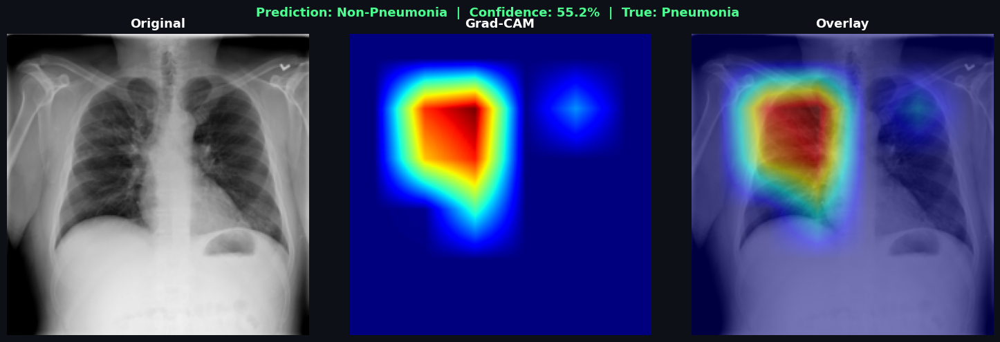

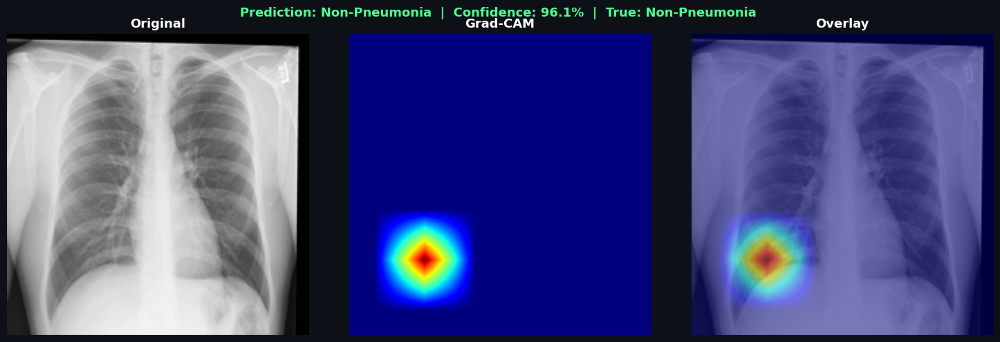

In [64]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(lambda m, i, o: setattr(self, 'activations', o.detach()))
        target_layer.register_full_backward_hook(lambda m, gi, go: setattr(self, 'gradients', go[0].detach()))
 
    def generate(self, tensor):
        self.model.zero_grad()
        output = self.model(tensor)
        output.backward()
        weights = self.gradients.mean(dim=[2, 3], keepdim=True)
        cam = torch.relu((weights * self.activations).sum(dim=1)).squeeze().cpu().numpy()
        cam = cv2.resize(cam, (224, 224))
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam, torch.sigmoid(output).item()
 

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
 
model = models.alexnet(weights=None)
model.classifier[6] = nn.Linear(4096, 1)
model.load_state_dict(torch.load('alexnet_chestxray.pth', map_location=DEVICE))
model = model.to(DEVICE).eval()
 
grad_cam = GradCAM(model, model.features[12])
 
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
 

def show_gradcam(img_path, true_label=None):
    img = Image.open(img_path).convert('RGB')
    tensor = transform(img).unsqueeze(0).to(DEVICE)
    tensor.requires_grad_(True)
 
    heatmap, prob = grad_cam.generate(tensor)
    img_np = np.array(img.resize((224, 224)))
    heatmap_color = cv2.cvtColor(cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
    overlay = (0.5 * img_np + 0.5 * heatmap_color).astype(np.uint8)
 
    pred = "Pneumonia" if prob >= 0.5 else "Non-Pneumonia"
    conf = prob if prob >= 0.5 else 1 - prob
 
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.patch.set_facecolor('#0d1117')
    for ax, title, im in zip(axes, ['Original', 'Grad-CAM', 'Overlay'],
                              [img_np, plt.cm.jet(heatmap)[:,:,:3], overlay]):
        ax.imshow(im); ax.set_title(title, color='white', fontsize=13, fontweight='bold'); ax.axis('off')
 
    color = '#ff4d4d' if pred == 'Pneumonia' else '#4dff91'
    title_str = f"Prediction: {pred}  |  Confidence: {conf:.1%}"
    if true_label is not None:
        true_str = "Pneumonia" if true_label == 1 else "Non-Pneumonia"
        title_str += f"  |  True: {true_str} {'' if true_str == pred else ''}"
    fig.suptitle(title_str, color=color, fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()
 

test_df = pd.read_csv('/kaggle/working/processed_data/test.csv')
 

show_gradcam(test_df[test_df['Target'] == 1].iloc[21]['path'], true_label=1)
 

show_gradcam(test_df[test_df['Target'] == 0].iloc[31]['path'], true_label=0)

In [66]:
!pip install lime -q
 
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import pandas as pd
from lime import lime_image
from skimage.segmentation import mark_boundaries
 

=== Pneumonia Sample ===


  0%|          | 0/1000 [00:00<?, ?it/s]

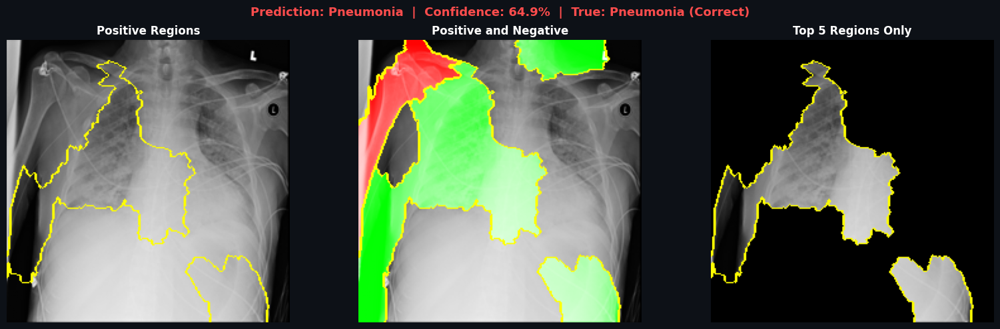

Pneumonia Probability: 0.6489

=== Non-Pneumonia Sample ===


  0%|          | 0/1000 [00:00<?, ?it/s]

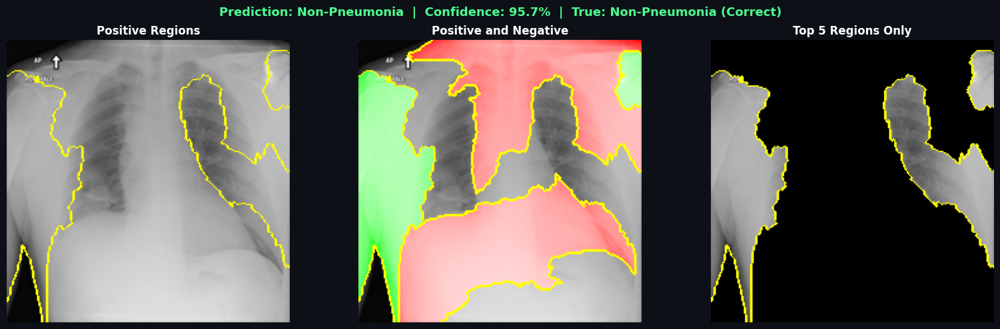

Pneumonia Probability: 0.0431


In [70]:
!pip install lime -q


import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import pandas as pd
from lime import lime_image
from skimage.segmentation import mark_boundaries


DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = models.alexnet(weights=None)
model.classifier[6] = nn.Linear(4096, 1)
model.load_state_dict(torch.load('alexnet_chestxray.pth', map_location=DEVICE))
model = model.to(DEVICE).eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


def predict_fn(images):
   
    batch = []
    for img in images:
        pil_img = Image.fromarray(img.astype(np.uint8)).convert('RGB')
        batch.append(transform(pil_img))
    batch = torch.stack(batch).to(DEVICE)

    with torch.no_grad():
        logits = model(batch)
        probs  = torch.sigmoid(logits).cpu().numpy().flatten()

    
    return np.column_stack([1 - probs, probs])


def show_lime(img_path, true_label=None, num_samples=1000):
  
    img = Image.open(img_path).convert('RGB').resize((224, 224))
    img_np = np.array(img)

    # Run LIME
    explainer   = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(
        img_np,
        predict_fn,
        top_labels=2,
        hide_color=0,
        num_samples=num_samples
    )

    prob = predict_fn([img_np])[0][1]
    pred = "Pneumonia" if prob >= 0.5 else "Non-Pneumonia"
    conf = prob if prob >= 0.5 else 1 - prob

    
    temp_pos, mask_pos = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=5,
        hide_rest=False
    )

    
    temp_both, mask_both = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=False,
        num_features=10,
        hide_rest=False
    )

    
    temp_sp, mask_sp = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=5,
        hide_rest=True
    )

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    fig.patch.set_facecolor('#0d1117')

    plots = [
        (mark_boundaries(temp_pos / 255.0, mask_pos),  'Positive Regions'),
        (mark_boundaries(temp_both / 255.0, mask_both), 'Positive and Negative'),
        (mark_boundaries(temp_sp / 255.0, mask_sp),    'Top 5 Regions Only'),
    ]

    for ax, (im, title) in zip(axes, plots):
        ax.imshow(im)
        ax.set_title(title, color='white', fontsize=12, fontweight='bold')
        ax.axis('off')

    color = '#ff4d4d' if pred == 'Pneumonia' else '#4dff91'
    title_str = f"Prediction: {pred}  |  Confidence: {conf:.1%}"
    if true_label is not None:
        true_str = "Pneumonia" if true_label == 1 else "Non-Pneumonia"
        correct  = "Correct" if true_str == pred else "Wrong"
        title_str += f"  |  True: {true_str} ({correct})"

    fig.suptitle(title_str, color=color, fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()
    print(f"Pneumonia Probability: {prob:.4f}")


test_df = pd.read_csv('/kaggle/working/processed_data/test.csv')


print("=== Pneumonia Sample ===")
show_lime(test_df[test_df['Target'] == 1].iloc[0]['path'], true_label=1)


print("\n=== Non-Pneumonia Sample ===")
show_lime(test_df[test_df['Target'] == 0].iloc[0]['path'], true_label=0)